In [67]:
import os
import json
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pymongo
from tqdm import tqdm
from scipy import stats
import math
import numpy as np

In [68]:
myclient = pymongo.MongoClient("mongodb://localhost:27017/")
db = myclient["imdb"]
imdb = db['imdb_cleaned']

In [69]:
num_movies = imdb.count_documents({})
num_movies

8181

In [70]:
rating_arr = []
raters_arr = []
revenue_arr = []

for movie in imdb.find():
    rating = float(movie['aggregateRating']['ratingValue'])
    raters = movie['aggregateRating']['ratingCount']
    revenue = movie['cleaned_Revenue']

    rating_arr.append(rating)
    raters_arr.append(raters)
    revenue_arr.append(revenue)

In [71]:
rating_arr = np.array(rating_arr)
revenue_arr = np.array(revenue_arr)
raters_arr = np.array(raters_arr)
rating_multiply_arr = raters_arr*rating_arr

rating_arr = rating_arr/10.0
revenue_arr = (revenue_arr - revenue_arr.min()) / (revenue_arr.max() - revenue_arr.min())
raters_arr = (raters_arr - raters_arr.min()) / (raters_arr.max() - raters_arr.min())
rating_multiply_arr = (rating_multiply_arr - rating_multiply_arr.min())/(rating_multiply_arr.max() - rating_multiply_arr.min())

# Linear Regression

In [72]:
from scipy.stats import spearmanr

In [73]:
spearmanr(rating_arr, revenue_arr)

SpearmanrResult(correlation=0.2655971398526104, pvalue=3.9500690222330995e-132)

In [74]:
spearmanr(raters_arr, revenue_arr)

SpearmanrResult(correlation=0.7801861572214819, pvalue=0.0)

In [75]:
spearmanr(rating_multiply_arr, revenue_arr)

SpearmanrResult(correlation=0.7697835187776355, pvalue=0.0)

In [76]:
import statsmodels.api as sm
from statsmodels.sandbox.regression.predstd import wls_prediction_std

In [77]:
rating_x = sm.add_constant(rating_arr)
model = sm.OLS(revenue_arr, rating_x)
results = model.fit()

In [78]:
raters_x = sm.add_constant(raters_arr)
model2 = sm.OLS(revenue_arr, raters_x)
results2 = model2.fit()

In [79]:
rating_multiply_x = sm.add_constant(rating_multiply_arr)
model3 = sm.OLS(revenue_arr, rating_multiply_x)
results3 = model3.fit()

In [80]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.063
Model:                            OLS   Adj. R-squared:                  0.063
Method:                 Least Squares   F-statistic:                     549.1
Date:                Sat, 29 May 2021   Prob (F-statistic):          1.38e-117
Time:                        02:57:40   Log-Likelihood:                 11779.
No. Observations:                8181   AIC:                        -2.355e+04
Df Residuals:                    8179   BIC:                        -2.354e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0587      0.004    -15.569      0.000      -0.066      -0.051
x1             0.1392      0.006     23.433      0.000       0.128       0.151
==============================================================================
Omnibus:                     8432.206   Durbin-Watson:                   1.511
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           717674.874
Skew:                           5.036   Prob(JB):                         0.00
Kurtosis:                      47.766   Cond. No.                         13.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [81]:
results2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.422
Model:                            OLS   Adj. R-squared:                  0.422
Method:                 Least Squares   F-statistic:                     5976.
Date:                Sat, 29 May 2021   Prob (F-statistic):               0.00
Time:                        02:57:41   Log-Likelihood:                 13757.
No. Observations:                8181   AIC:                        -2.751e+04
Df Residuals:                    8179   BIC:                        -2.750e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0088      0.001     15.816      0.000       0.008       0.010
x1             0.5742      0.007     77.307      0.000       0.560       0.589
==============================================================================
Omnibus:                     7143.111   Durbin-Watson:                   1.959
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           817114.130
Skew:                           3.663   Prob(JB):                         0.00
Kurtosis:                      51.409   Cond. No.                         14.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [82]:
results3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.377
Model:                            OLS   Adj. R-squared:                  0.377
Method:                 Least Squares   F-statistic:                     4959.
Date:                Sat, 29 May 2021   Prob (F-statistic):               0.00
Time:                        02:57:51   Log-Likelihood:                 13452.
No. Observations:                8181   AIC:                        -2.690e+04
Df Residuals:                    8179   BIC:                        -2.689e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0121      0.001     21.286      0.000       0.011       0.013
x1             0.6254      0.009     70.418      0.000       0.608       0.643
==============================================================================
Omnibus:                     7025.005   Durbin-Watson:                   1.917
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           744833.089
Skew:                           3.586   Prob(JB):                         0.00
Kurtosis:                      49.191   Cond. No.                         17.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [83]:
from statsmodels.stats.outliers_influence import summary_table

In [84]:
def plot_regression_line(results, xrr, yrr):

    st, data, ss2 = summary_table(results, alpha=0.05)

    fittedvalues = data[:, 2]
    predict_mean_se  = data[:, 3]
    predict_mean_ci_low, predict_mean_ci_upp = data[:, 4:6].T
    predict_ci_low, predict_ci_upp = data[:, 6:8].T

    fig = make_subplots()
    fig.add_trace(
        go.Scatter(
            x=xrr, 
            y=yrr, 
            name="Data",
            mode='markers',
            line_color='rgba(153, 153, 255, .6)'
        ),
    )
    fig.add_trace(
        go.Scatter(
            x=xrr, 
            y=fittedvalues, 
            name="regression line",
            # mode='lines',
            # line_color='green'
            line=dict(color='green', width=3)
        ),
    )
    fig.add_trace(
        go.Scatter(
            x=xrr, 
            y=predict_ci_low, 
            name="95% prediction band",
            line=dict(color='rgba(153, 0, 51, .5)', width=1, dash='dot')
        ),
    )
    fig.add_trace(
        go.Scatter(
            x=xrr, 
            y=predict_ci_upp, 
            line=dict(color='rgba(153, 0, 51, .5)', width=1, dash='dot'),
            showlegend=False
        ),
    )

    fig.add_trace(
        go.Scatter(
            x=xrr, 
            y=predict_mean_ci_low, 
            name="95% prediction region",
            mode='lines',
            line=dict(color='rgba(0, 153, 51, .5)', width=1, dash='dot'),
        ),
    )
    fig.add_trace(
        go.Scatter(
            x=xrr, 
            y=predict_mean_ci_upp, 
            line=dict(color='rgba(0, 153, 51, .5)', width=1, dash='dot'),
            showlegend=False
        ),
    )

    fig.update_layout(legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ))
    fig.update_layout(
        height=600, 
        width=800,
    )
    # fig.update_layout(
    #     # margin=dict(l=10, r=10, t=10, b=10),
    #     paper_bgcolor="LightSteelBlue",
    # )
    
    return fig

In [85]:
fig = plot_regression_line(results, rating_arr, revenue_arr)
fig.update_layout(
     margin=dict(l=10, r=10, t=10, b=10),
     # paper_bgcolor="LightSteelBlue",
)

fig.update_layout(
    # title="Plot Title",
    yaxis_title="Revenue (Normalized)",
    xaxis_title="IMDb rating (Normalized)",
    # legend_title="Legend Title",
)

fig.update_layout(
    font_family="Times New Roman",
    font_color="black",
    title_font_family="Times New Roman",
    title_font_color="black",
    legend_title_font_color="green",
)
fig.update_layout(font=dict(size=18))
fig.show()

In [86]:
# results.summary()
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
xxrr = rating_arr.reshape(rating_arr.shape[0],1)
regressor.fit(xxrr, revenue_arr)

LinearRegression()

In [87]:
regressor.coef_, regressor.intercept_

(array([0.13924754]), -0.0586742524529875)

In [98]:
fig = plot_regression_line(results2, raters_arr, revenue_arr)
fig.update_layout(
     margin=dict(l=10, r=10, t=10, b=10),
     # paper_bgcolor="LightSteelBlue",
)

fig.update_layout(
    # title="Plot Title",
    xaxis_title="Number of raters (Normalized)",
    yaxis_title="Revenue (Normalized)",
    # legend_title="Legend Title",
)

fig.update_layout(
    font_family="Times New Roman",
    font_color="black",
    title_font_family="Times New Roman",
    title_font_color="black",
    legend_title_font_color="green",
)
fig.update_layout(font=dict(size=18))
fig.show()

In [89]:
fig = plot_regression_line(results3, rating_multiply_arr, revenue_arr)
fig.show()

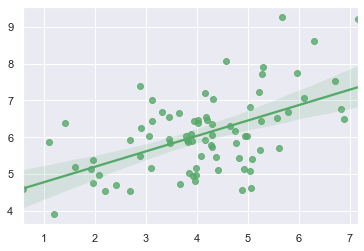

In [90]:
import numpy as np
np.random.seed(8)
import seaborn as sns
sns.set_theme(color_codes=True)

mean, cov = [4, 6], [(1.5, .7), (.7, 1)]
x, y = np.random.multivariate_normal(mean, cov, 80).T

ax = sns.regplot(x=x, y=y, color="g")

In [91]:
# x, y

In [92]:
import statsmodels.api as sm
from statsmodels.sandbox.regression.predstd import wls_prediction_std

x = sm.add_constant(x)
model_check = sm.OLS(y,x)
results_check = model_check.fit()
results_check.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.296
Model:                            OLS   Adj. R-squared:                  0.287
Method:                 Least Squares   F-statistic:                     32.82
Date:                Sat, 29 May 2021   Prob (F-statistic):           1.82e-07
Time:                        02:58:34   Log-Likelihood:                -104.00
No. Observations:                  80   AIC:                             212.0
Df Residuals:                      78   BIC:                             216.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.3574      0.315     13.836      0.000       3.730       4.984
x1             0.4191      0.073      5.729      0.000       0.273       0.565
==============================================================================
Omnibus:                        2.239   Durbin-Watson:                   2.033
Prob(Omnibus):                  0.326   Jarque-Bera (JB):                2.004
Skew:                           0.386   Prob(JB):                        0.367
Kurtosis:                       2.936   Cond. No.                         14.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [93]:
fig = plot_regression_line(results_check, x, y)
fig.show()

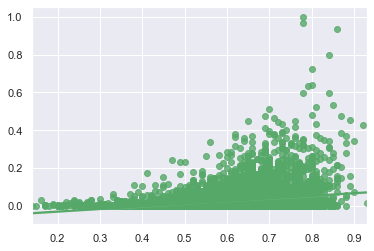

In [94]:
ax = sns.regplot(x=rating_arr, y=revenue_arr, color="g")

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns

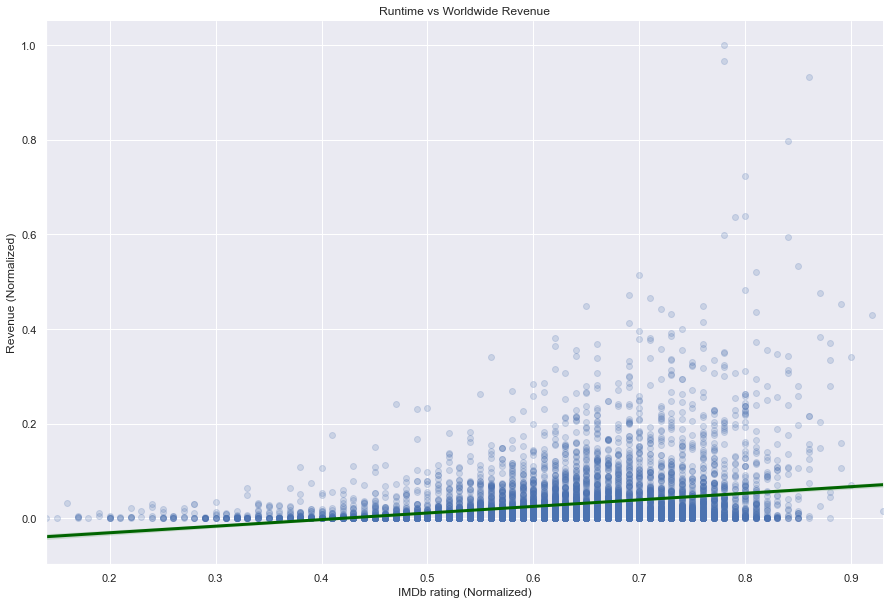

In [96]:
plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(15, 10))
sns.regplot(
    x = rating_arr, 
    y = revenue_arr, 
    scatter_kws={'alpha':0.2}, 
    line_kws={"color": "darkgreen", 'linewidth': 3}, 
    order=1
)
plt.title('Runtime vs Worldwide Revenue')          # Set title.
plt.xlabel("IMDb rating (Normalized)")       # Set x-axis label.
plt.ylabel('Revenue (Normalized)')    # Set y-axis label.
# plt.ylim(-3, 4*1e9)
sns.despine()
plt.savefig('rating_vs_revenue_order_1.png')

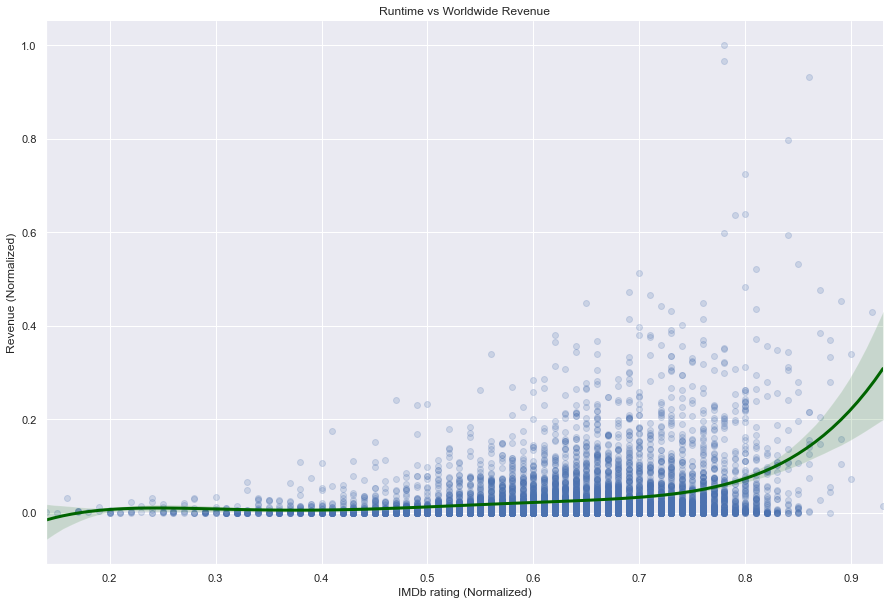

In [97]:
plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(15, 10))
sns.regplot(
    x = rating_arr, 
    y = revenue_arr, 
    scatter_kws={'alpha':0.2}, 
    line_kws={"color": "darkgreen", 'linewidth': 3}, 
    order=5
)
plt.title('Runtime vs Worldwide Revenue')          # Set title.
plt.xlabel("IMDb rating (Normalized)")       # Set x-axis label.
plt.ylabel('Revenue (Normalized)')    # Set y-axis label.
# plt.ylim(-3, 4*1e9)
sns.despine()
plt.savefig('rating_vs_revenue_order_5.png')